In [1]:
import pandas as pd
import numpy as np
from eda_tools import *

import fuzzywuzzy
from fuzzywuzzy import process

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor as RF
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error

In [2]:
pd.options.display.max_rows=100
pd.options.display.max_columns = 100
data = pd.read_csv('train.csv', index_col=0)
data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


<a id='table'></a>

# Table of Contents
1. [Basic Data Cleaning](#step1)
    1. [Check for nulls](#1a)
    2. [Check for Duplicates](#1b)
    3. [Check for data entry](#1c)
    4. [Univariate Analysis on Dependent Variable](#1d)
    5. [Bivariate Analysis on Dependent Variable](#1e)
    6. [Drop outlier from Target Variable](#1f)
    7. [Univariate Analysis on the Features](#1g)
    8. [Multivariate Analysis on the Features](#1h)
2. [Data Transformation](#step2)
3. [B](#4)

<a id='step1'></a>
## 1)Data Cleaning

<a id='1a'></a>
### 1A) Basic Data Cleaning: Check nulls

[Back to Table of Contents](#table)

In [3]:
null_cols = data.loc[:,data.isnull().any()].isnull().sum().index
print(f'Number of null columns is {len(null_cols)}')
print(data.loc[:,data.isnull().any()].isnull().sum())

Number of null columns is 19
LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


<a id='1b'></a>
### 1B) Check for Duplicates
[Back to Table of Contents](#table)

In [4]:
# Check for rows which have the same values across all columns
data.duplicated().sum()
print('There are no dulplicates')

There are no dulplicates


<a id='1c'></a>

### 1C) Check for data entry errors in categorical data 

[Back to Table of Contents](#table)

In [5]:
# Split columns into numercial and categorical data
print(f'Total number of columns in data {len(data.columns)}')
data_num = data.select_dtypes(exclude='O')
data_cat = data.select_dtypes(include=['O'])
print(f'Total number of columns in data_num {len(data_num.columns)}')
print(f'Total number of columns in data_cat {len(data_cat.columns)}')
print(f'Total number of columns in data_cat and data_num {len(data_cat.columns) + len(data_num.columns)}')

Total number of columns in data 80
Total number of columns in data_num 37
Total number of columns in data_cat 43
Total number of columns in data_cat and data_num 80


In [6]:
#data_cat.apply(lambda x: print(x.unique()))
for col in data_cat:
    print(col, data_cat[col].unique())

MSZoning ['RL' 'RM' 'C (all)' 'FV' 'RH']
Street ['Pave' 'Grvl']
Alley [nan 'Grvl' 'Pave']
LotShape ['Reg' 'IR1' 'IR2' 'IR3']
LandContour ['Lvl' 'Bnk' 'Low' 'HLS']
Utilities ['AllPub' 'NoSeWa']
LotConfig ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
LandSlope ['Gtl' 'Mod' 'Sev']
Neighborhood ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']
Condition1 ['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe']
Condition2 ['Norm' 'Artery' 'RRNn' 'Feedr' 'PosN' 'PosA' 'RRAn' 'RRAe']
BldgType ['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 'Twnhs']
HouseStyle ['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']
RoofStyle ['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Shed']
RoofMatl ['CompShg' 'WdShngl' 'Metal' 'WdShake' 'Membran' 'Tar&Grv' 'Roll'
 'ClyTile']
Exterior1st ['VinylSd' 'MetalSd'

In [7]:
# as a dict of dataframes
df_dict = dict(zip([i for i in data_cat.columns] , [pd.DataFrame(data_cat[i].unique(), columns=[i]) for i in data_cat.columns]))

# as a list of dataframe , convert to lowercase and strip out spaces, before applying unique  
data_cat_unique = [pd.DataFrame(data_cat[i].str.lower().str.strip().unique(), columns=[i]) for i in data_cat.columns]

In [8]:
data_cat_unique

[  MSZoning
 0       rl
 1       rm
 2  c (all)
 3       fv
 4       rh,
   Street
 0   pave
 1   grvl,
   Alley
 0   NaN
 1  grvl
 2  pave,
   LotShape
 0      reg
 1      ir1
 2      ir2
 3      ir3,
   LandContour
 0         lvl
 1         bnk
 2         low
 3         hls,
   Utilities
 0    allpub
 1    nosewa,
   LotConfig
 0    inside
 1       fr2
 2    corner
 3   culdsac
 4       fr3,
   LandSlope
 0       gtl
 1       mod
 2       sev,
    Neighborhood
 0       collgcr
 1       veenker
 2       crawfor
 3       noridge
 4       mitchel
 5       somerst
 6        nwames
 7       oldtown
 8       brkside
 9        sawyer
 10      nridght
 11        names
 12      sawyerw
 13       idotrr
 14      meadowv
 15      edwards
 16       timber
 17      gilbert
 18      stonebr
 19      clearcr
 20      npkvill
 21      blmngtn
 22       brdale
 23        swisu
 24      blueste,
   Condition1
 0       norm
 1      feedr
 2       posn
 3     artery
 4       rrae
 5       rrnn
 6       

In [9]:
# get the top 10 closest matches to "NWAmes"
matches = fuzzywuzzy.process.extract("NWAmes", data_cat['Neighborhood'].unique(), limit=10, scorer=fuzzywuzzy.fuzz.token_sort_ratio)
# take a look at them
matches

[('NWAmes', 100),
 ('NAmes', 91),
 ('Somerst', 46),
 ('Edwards', 46),
 ('SWISU', 36),
 ('Sawyer', 33),
 ('Timber', 33),
 ('BrDale', 33),
 ('Veenker', 31),
 ('NoRidge', 31)]

#### Utilize check_matches to detect mispelled labels

In [10]:
all_matches, highly_match = check_matches(data, 5,90)


There are no duplicate rows
All done!


In [11]:
len(highly_match)
highly_match
print('No mispelt labels so far in all columns')

No mispelt labels so far in all columns


<a id='1d'></a>
### 1D)Univariate Analysis on Target

[Back to Table of Contents](#table)

Skewness of target 1.8828757597682129


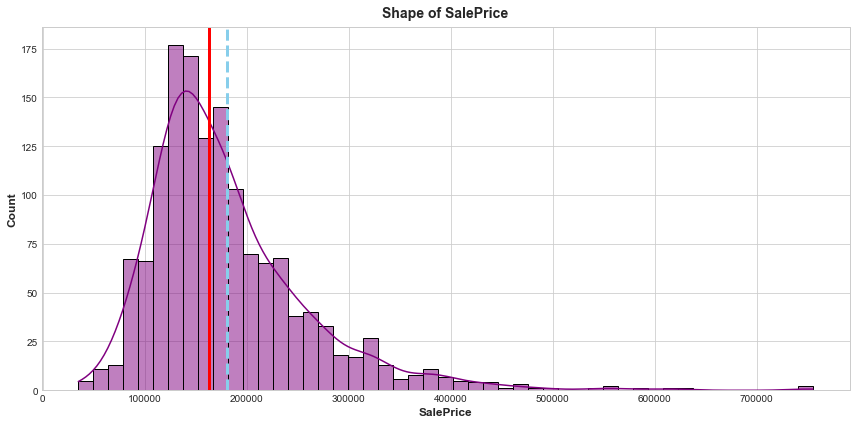

In [12]:
skewness = data['SalePrice'].skew()
print(f'Skewness of target {skewness}')

fig = plt.figure(figsize=(12,6))
sns.histplot(data['SalePrice'], kde=True, color='purple')
plt.axvline(x=data['SalePrice'].mean(), color='skyblue', linestyle='--', linewidth=3)
plt.axvline(x=data['SalePrice'].median(), color='red', linewidth=3)
plt.title('Shape of SalePrice')
plt.show()

#### Kaggle requires metric to be measure by log mse . So Logarithm transformation will be applied to target


In [13]:
b4_log = data['SalePrice']
data['SalePrice'] = np.log(data['SalePrice'])

skewness = data['SalePrice'].skew()
print(f'Skewness of target {skewness}')

Skewness of target 0.12133506220520406


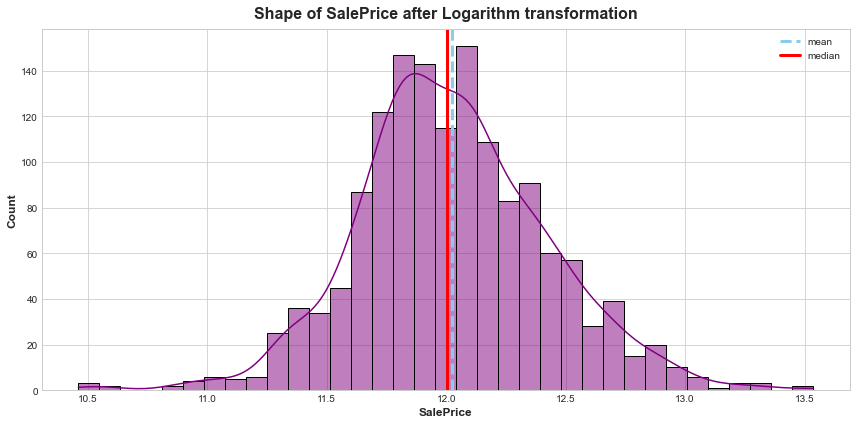

In [14]:
fig = plt.figure(figsize=(12,6))
sns.histplot(data['SalePrice'], kde=True, color='purple')
plt.axvline(x=data['SalePrice'].mean(), color='skyblue', linestyle='--', linewidth=3, label='mean')
plt.axvline(x=data['SalePrice'].median(), color='red', linewidth=3, label='median')
plt.legend()
plt.title('Shape of SalePrice after Logarithm transformation', fontsize=16)
plt.show()

#### Check for outliers in target

![Boxplot_Distributions](Boxplot_Distribution.png)

#### Calculate the z-score for each value in target column

In [15]:
# Calculate zscore of target
print(f'Mean of SalePrice {data["SalePrice"].mean()}')
print(f'STD of SalePrice {data["SalePrice"].std()}')
z = (data[['SalePrice']] - data[['SalePrice']].mean())/data[["SalePrice"]].std()
z = z.rename(columns={'SalePrice': 'z-score'})
z.head()
print('\nCalculate the InterQuartile Range')
print(data[["SalePrice"]].describe())
print(f'Inter-quartile range : {12.273731 - 11.775097}')

Mean of SalePrice 12.024050901109383
STD of SalePrice 0.39945186826116424

Calculate the InterQuartile Range
         SalePrice
count  1460.000000
mean     12.024051
std       0.399452
min      10.460242
25%      11.775097
50%      12.001505
75%      12.273731
max      13.534473
Inter-quartile range : 0.49863399999999913


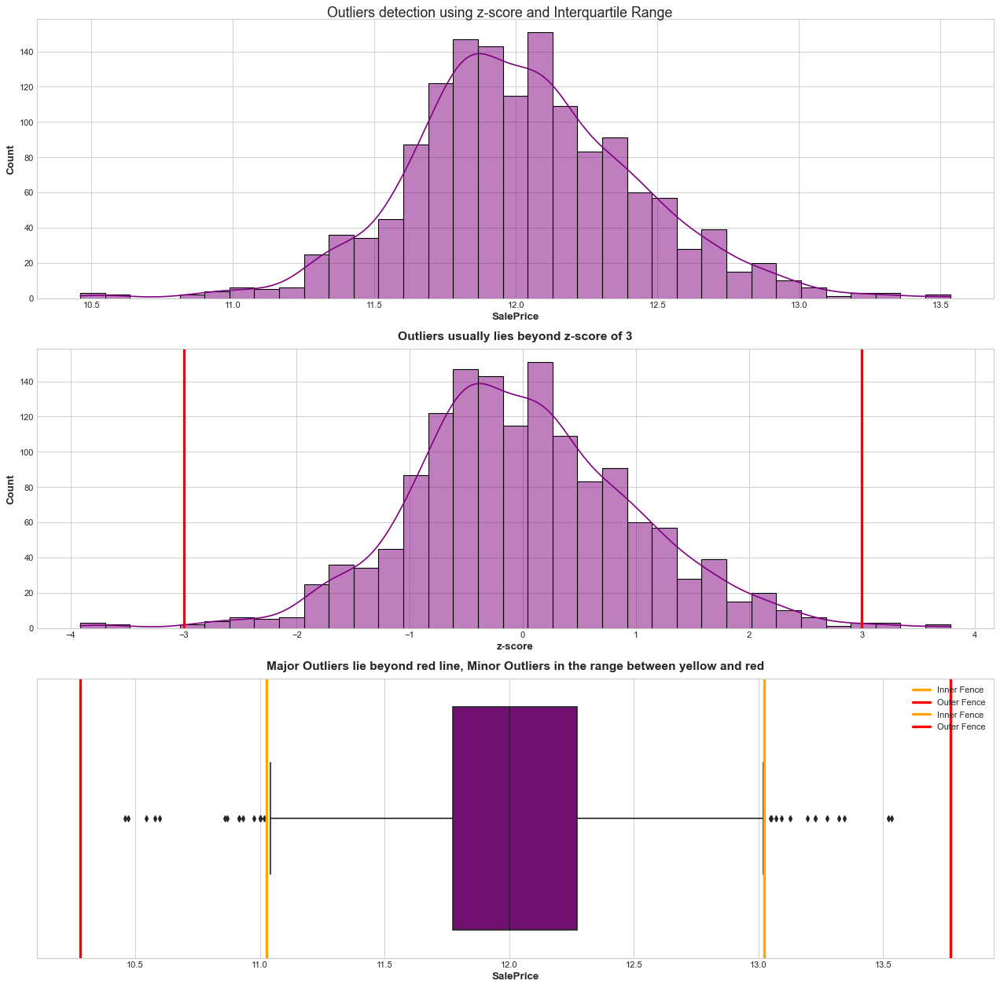

In [16]:
#sns.boxplot(x='diagnosis', y='area_mean', data=df)
fig, ax = plt.subplots(3,1, figsize=(16,16),dpi=80)
#fig.suptitle('Comparison of "SalePrice" after log scale', fontsize=16)
fig.tight_layout(pad=6.0)
fig.suptitle('Outliers detection using z-score and Interquartile Range', fontsize=16)
sns.histplot(data['SalePrice'], color='purple', kde=True,ax=ax[0])
sns.histplot(z['z-score'], color='purple', kde=True,ax=ax[1])
ax[1].axvline(x=3, color='red', linewidth=3)
ax[1].axvline(x=-3, color='red', linewidth=3)
ax[1].set_title('Outliers usually lies beyond z-score of 3')
sns.boxplot(x=data['SalePrice'] ,color='purple',ax=ax[2])
ax[2].axvline(x= 12.273731 + (1.5* 0.49863399999999913), color='orange', linewidth=3, label="Inner Fence")
ax[2].axvline(x=12.273731  + (3* 0.49863399999999913), color='red', linewidth=3,  label="Outer Fence")
ax[2].axvline(x= 11.775097 - (1.5* 0.49863399999999913), color='orange', linewidth=3, label="Inner Fence")
ax[2].axvline(x=11.775097  - (3* 0.49863399999999913), color='red', linewidth=3, label="Outer Fence")
ax[2].set_title('Major Outliers lie beyond red line, Minor Outliers in the range between yellow and red')
ax[2].legend()
plt.show()

#### Examine data at the extreme edges

In [17]:
print('Examine rows that have SalePrice less than 10.75 and higher than 13')

potential_outliers = data[(data['SalePrice'] > 13.5) | (data['SalePrice'] < 10.75)]
print(f'Total potential outliers {potential_outliers.shape[0]}')

potential_outliers_index = potential_outliers.index
potential_outliers.sort_values(by='SalePrice', ascending=False)[['GrLivArea', 'OverallQual','Neighborhood','SalePrice']]

Examine rows that have SalePrice less than 10.75 and higher than 13
Total potential outliers 7


,GrLivArea,OverallQual,Neighborhood,SalePrice
Id,,,,
692,4316,10,NoRidge,13.534473
1183,4476,10,NoRidge,13.521139
31,1317,4,IDOTRR,10.596635
534,334,1,BrkSide,10.578980
969,968,3,OldTown,10.542706
917,480,2,IDOTRR,10.471950
496,720,4,IDOTRR,10.460242


There are 2 outliers that fall on the extreme high price level.
Check on the prices of property of GrLivArea above 3000

Price of house above 3000 in GrLivArea
      GrLivArea Neighborhood  OverallQual SaleCondition  SalePrice
Id                                                                
119        3222      SawyerW            7        Normal  12.676076
186        3608      OldTown           10        Normal  13.071070
198        3112        NAmes            8       Abnorml  12.367341
305        3493      OldTown            7        Normal  12.594731
497        3228      NoRidge            8        Normal  12.971540
524        4676      Edwards           10       Partial  12.126759
609        3194      Crawfor            8        Alloca  12.791356
636        3395        SWISU            6       Abnorml  12.206073
692        4316      NoRidge           10        Normal  13.534473
770        3279      StoneBr            8        Normal  13.195614
799        3140      NridgHt            9       Partial  13.091904
1032       3082        SWISU            7        Normal  12.190959
1170       3627      No

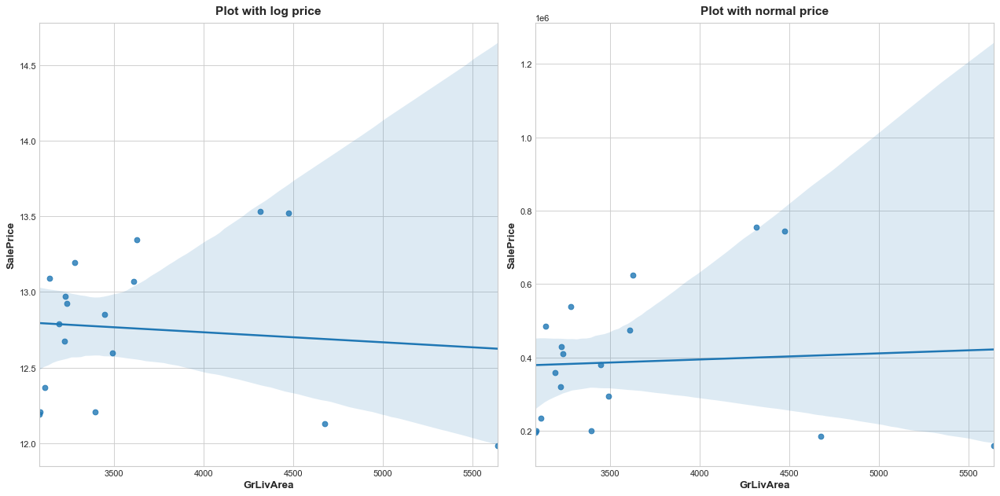

In [18]:
print('Price of house above 3000 in GrLivArea')
print(data[(data['GrLivArea'] > 3000) ][['GrLivArea','Neighborhood','OverallQual', 'SaleCondition', 'SalePrice']])

fig, ax = plt.subplots(1,2,figsize=(16,8), dpi=80)
ax[0].set_title('Plot with log price')
sns.regplot(x=data[(data['GrLivArea'] > 3000)]['GrLivArea'], y=data[(data['GrLivArea'] > 3000)]['SalePrice'], ax=ax[0])
ax[1].set_title('Plot with normal price')
sns.regplot(x=data[(data['GrLivArea'] > 3000)]['GrLivArea'], y=np.exp(data[(data['GrLivArea'] > 3000)]['SalePrice']), ax=ax[1])
plt.show()

In [19]:
count

NameError: name 'count' is not defined

In [ ]:
print('The low prices of these 2 houses with large area seems wierd')
print(data.loc[[524,1299],:][['Neighborhood', 'GrLivArea','SalePrice']])

pd.options.display.max_rows=1000
ngroup = data[data['SalePrice']>11.9][['Neighborhood','GrLivArea', 'SalePrice']].groupby(['Neighborhood', 'GrLivArea'])['SalePrice'].mean()

total = 0
count = 0
for i in ngroup.index:
    if i[0]=='Edwards':
        print(i,ngroup[i])
        total += ngroup[i]
        count += 1

print(f'Average sale price of house in Edward Neighborhood is {total/count}')
print('These are 2 of the largest houses in the dataset but selling for less than average pricing of its neighborhood ')

### Conclusion after unvariate analysis

After cross checking the high prices of the outliers against the chart as well as the prices of similar size houses in the neighborhood. I find that the high pricing outlier may not be much of an outlier afterall. I will prob keep them.

However instead i found row `1299` and `524` more likely to be outliers given that size and extreme price that they are beening sold for



<a id='1e'></a>
 
### Bivariate Analysis on Target

[Back to Table of Contents](#table)

#### Use mutual information to see which continous feature is strong correlated with Target value


In [20]:
print(f"Columns in data_num that have null values\n{data_num.loc[:,data_num.isnull().any().values].isnull().sum()}")

print('Missing values in all the columns are due to non existence of the item. \nWill impute null cells with 0 instead')

# check out rows that have null values in the mentioned cols
data[data_num[['LotFrontage','GarageYrBlt']].isna().any(axis=1)].head()

Columns in data_num that have null values
LotFrontage    259
MasVnrArea       8
GarageYrBlt     81
dtype: int64
Missing values in all the columns are due to non existence of the item. 
Will impute null cells with 0 instead


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,12.206073
13,20,RL,NaN,12968,Pave,NaN,IR2,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1962,1962,Hip,CompShg,HdBoard,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,737,Unf,0,175,912,GasA,TA,Y,SBrkr,912,0,0,912,1,0,1,0,2,1,TA,4,Typ,0,NaN,Detchd,1962.0,Unf,1,352,TA,TA,Y,140,0,0,0,176,0,NaN,NaN,NaN,0,9,2008,WD,Normal,11.877569
15,20,RL,NaN,10920,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1960,1960,Hip,CompShg,MetalSd,MetalSd,BrkFace,212.0,TA,TA,CBlock,TA,TA,No,BLQ,733,Unf,0,520,1253,GasA,TA,Y,SBrkr,1253,0,0,1253,1,0,1,1,2,1,TA,5,Typ,1,Fa,Attchd,1960.0,RFn,1,352,TA,TA,Y,0,213,176,0,0,0,NaN,GdWo,NaN,0,5,2008,WD,Normal,11.964001
17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,7,1970,1970,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,ALQ,578,Unf,0,426,1004,GasA,Ex,Y,SBrkr,1004,0,0,1004,1,0,1,0,2,1,TA,5,Typ,1,TA,Attchd,1970.0,Fin,2,480,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,Shed,700,3,2010,WD,Normal,11.911702
25,20,RL,NaN,8246,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,8,1968,2001,Gable,CompShg,Plywood,Plywood,None,0.0,TA,Gd,CBlock,TA,TA,Mn,Rec,188,ALQ,668,204,1060,GasA,Ex,Y,SBrkr,1060,0,0,1060,1,0,1,0,3,1,Gd,6,Typ,1,TA,Attchd,1968.0,Unf,1,270,TA,TA,Y,406,90,0,0,0,0,NaN,MnPrv,NaN,0,5,2010,WD,Normal,11.944708


In [21]:
# Understand if there is any relations with lotfrontage and saleprice when staying different neighbourhoods
import plotly.express as px
frame = data.pivot_table(index = 'Neighborhood',columns= 'LotFrontage',values = 'SalePrice',aggfunc = 'mean')
px.bar(frame)

data.groupby(['Neighborhood', 'LotFrontage'])['SalePrice'].mean()

# impute null cells with 0
temp_num = data_num.fillna(0)

In [22]:
from sklearn.feature_selection import mutual_info_regression
discrete_features = [pd.api.types.is_integer_dtype(t) for t in temp_num.iloc[:,:-1].dtypes]
MI = mutual_info_regression(temp_num.iloc[:,:-1], np.log(b4_log), discrete_features=discrete_features, random_state=0, n_neighbors=3)

MI = pd.Series(MI, name="MI Scores", index=temp_num.iloc[:,:-1].columns)
MI = MI.sort_values(ascending=False)

print(MI.round(4)[:10].to_markdown())

|              |   MI Scores |
|:-------------|------------:|
| OverallQual  |      0.5753 |
| GarageArea   |      0.5066 |
| GrLivArea    |      0.4318 |
| TotalBsmtSF  |      0.4096 |
| YearBuilt    |      0.4047 |
| LotArea      |      0.3998 |
| GarageCars   |      0.3632 |
| 1stFlrSF     |      0.2864 |
| MSSubClass   |      0.281  |
| YearRemodAdd |      0.2768 |


#### Examine 'SaleCondition' feature in relation to Outliers

In [23]:
potential_outliers[['SalePrice','Neighborhood','OverallQual','SaleCondition','GrLivArea']].sort_values(by='SalePrice', ascending=False)

,SalePrice,Neighborhood,OverallQual,SaleCondition,GrLivArea
Id,,,,,
692,13.534473,NoRidge,10,Normal,4316
1183,13.521139,NoRidge,10,Abnorml,4476
31,10.596635,IDOTRR,4,Normal,1317
534,10.578980,BrkSide,1,Normal,334
969,10.542706,OldTown,3,Abnorml,968
917,10.471950,IDOTRR,2,Abnorml,480
496,10.460242,IDOTRR,4,Abnorml,720


In [24]:
data.groupby(['Neighborhood','OverallQual']).agg({'MoSold':'count', 'SalePrice':'mean', 'GrLivArea':'mean'})

MoSold  SalePrice    GrLivArea
Neighborhood OverallQual                                
Blmngtn      7                14  12.139328  1427.357143
             8                 3  12.309824  1430.666667
Blueste      6                 2  11.826536  1392.500000
BrDale       5                 5  11.668091  1327.200000
             6                11  11.493216  1059.545455
...                          ...        ...          ...
Veenker      5                 2  12.233932  1434.500000
             6                 4  12.065002  1389.250000
             7                 1  12.591335  2167.000000
             8                 3  12.535243  1500.333333
             9                 1  12.860999  1842.000000

[114 rows x 3 columns]

In [25]:
#For apply log transform to GrLivArea as well ddfghfdg

data2 = data.copy()
data2['GrLivArea'] = np.log(data['GrLivArea'])

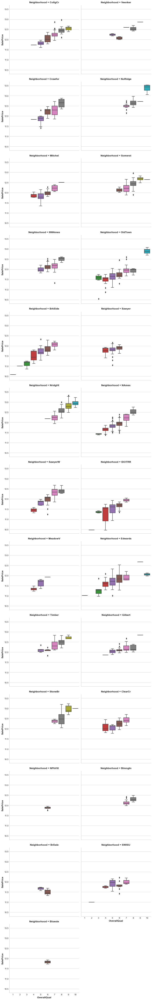

In [26]:
sns.catplot(data=data[['Neighborhood','GrLivArea','OverallQual','SalePrice']], x='OverallQual', y='SalePrice',col='Neighborhood', kind='box', col_wrap=2)
plt.show()

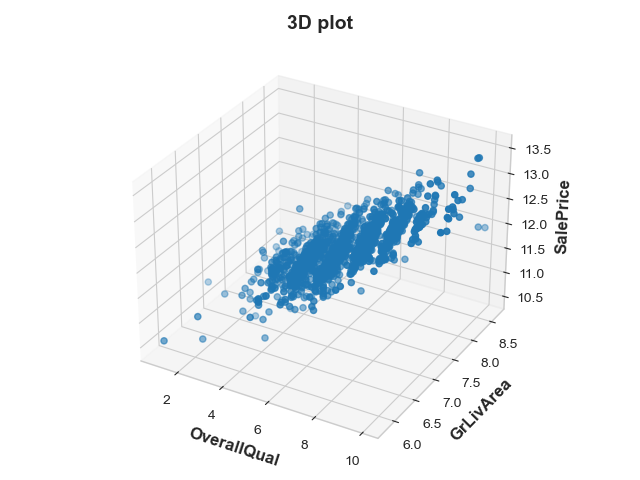

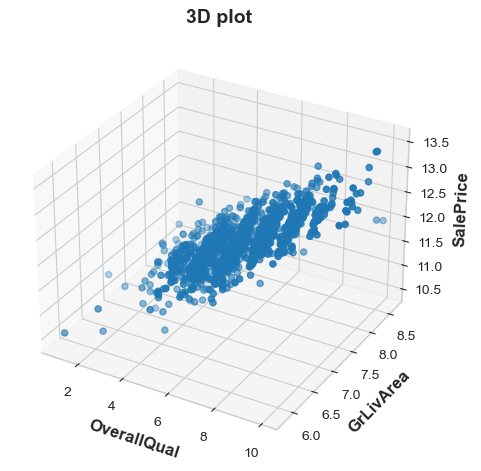

In [27]:
# to interacte  with plot
%matplotlib widget

# importing required libraries
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')


ax.scatter(xs=data2['OverallQual'],ys= data2['GrLivArea'],zs = data2['SalePrice'])
ax.set_title("3D plot")
ax.set_xlabel('OverallQual')
ax.set_ylabel('GrLivArea')
ax.set_zlabel('SalePrice')

fig.show()

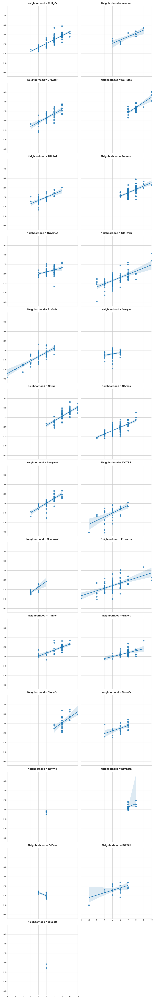

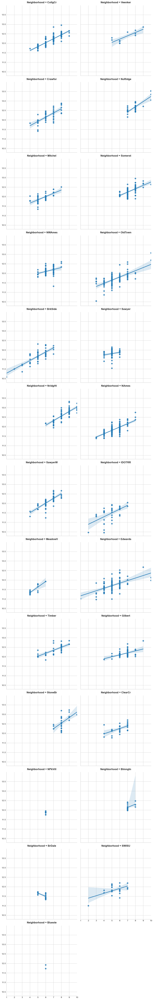

In [28]:
g = sns.FacetGrid(data[['Neighborhood','GrLivArea','OverallQual','SalePrice']], col="Neighborhood", col_wrap=2, height=5, )
g.map_dataframe(sns.regplot, x='OverallQual', y = 'SalePrice', data=data[['Neighborhood','GrLivArea','OverallQual','SalePrice']])
g.add_legend()
plt.show()

In [29]:
print('This is the average sale price in log for each sale conditon (Prices in log)\n')
print(data.groupby(['SaleCondition'])['SalePrice'].mean().to_markdown())
print('\nThis is the average price for each sale condition converted back to norm')
print(tuple(zip(data['SaleCondition'].unique(),np.exp(data.groupby(data['SaleCondition'])['SalePrice'].mean().values))))

print('\nThis is the 5 smallest sales found in the list of potential outliers. (Prices in log)\n')
print(potential_outliers.sort_values(by='SalePrice',ascending=False).tail()[['SaleCondition','SalePrice']].to_markdown())

print('\nThis is the selling price(norm price) of the 5 smallest sales.\nThe sale price is quite low compare to average sale price')
tuple(zip(potential_outliers.sort_values(by='SalePrice',ascending=False).tail()[['SaleCondition','OverallQual']].values ,np.exp(potential_outliers.sort_values(by='SalePrice',ascending=False).tail()['SalePrice']).values))

This is the average sale price in log for each sale conditon (Prices in log)

| SaleCondition   |   SalePrice |
|:----------------|------------:|
| Abnorml         |     11.7888 |
| AdjLand         |     11.5291 |
| Alloca          |     11.9145 |
| Family          |     11.8697 |
| Normal          |     12.005  |
| Partial         |     12.4475 |

This is the average price for each sale condition converted back to norm
(('Normal', 131764.86453980635), ('Abnorml', 101635.37649340088), ('Partial', 149411.23917644648), ('AdjLand', 142864.92037147455), ('Alloca', 163576.11440237227), ('Family', 254607.02821140687))

This is the 5 smallest sales found in the list of potential outliers. (Prices in log)

|   Id | SaleCondition   |   SalePrice |
|-----:|:----------------|------------:|
|   31 | Normal          |     10.5966 |
|  534 | Normal          |     10.579  |
|  969 | Abnorml         |     10.5427 |
|  917 | Abnorml         |     10.4719 |
|  496 | Abnorml         |     10.4602 |

This

((array(['Normal', 4], dtype=object), 39999.99999999997),
 (array(['Normal', 1], dtype=object), 39299.99999999998),
 (array(['Abnorml', 3], dtype=object), 37899.99999999998),
 (array(['Abnorml', 2], dtype=object), 35311.000000000015),
 (array(['Abnorml', 4], dtype=object), 34900.00000000001))

In [30]:
pd.options.display.max_rows=1400
print('TOP 5 columns that has the strong relation with SalePrice are as below:')
print(data_num.corr()['SalePrice'].sort_values(ascending=False)[:10])
print('\n')
print('Will chose GrLivArea to do bivariate analysis with SalePrice as it is relatively continuous data as compare to OverallQual though has the high correlation but is categorcial data ')
print(data[data_num.corr()['SalePrice'].sort_values(ascending=False)[:5].index].nunique())


TOP 5 columns that has the strong relation with SalePrice are as below:
SalePrice       1.000000
OverallQual     0.790982
GrLivArea       0.708624
GarageCars      0.640409
GarageArea      0.623431
TotalBsmtSF     0.613581
1stFlrSF        0.605852
FullBath        0.560664
TotRmsAbvGrd    0.533723
YearBuilt       0.522897
Name: SalePrice, dtype: float64


Will chose GrLivArea to do bivariate analysis with SalePrice as it is relatively continuous data as compare to OverallQual though has the high correlation but is categorcial data 
SalePrice      663
OverallQual     10
GrLivArea      861
GarageCars       5
GarageArea     441
dtype: int64


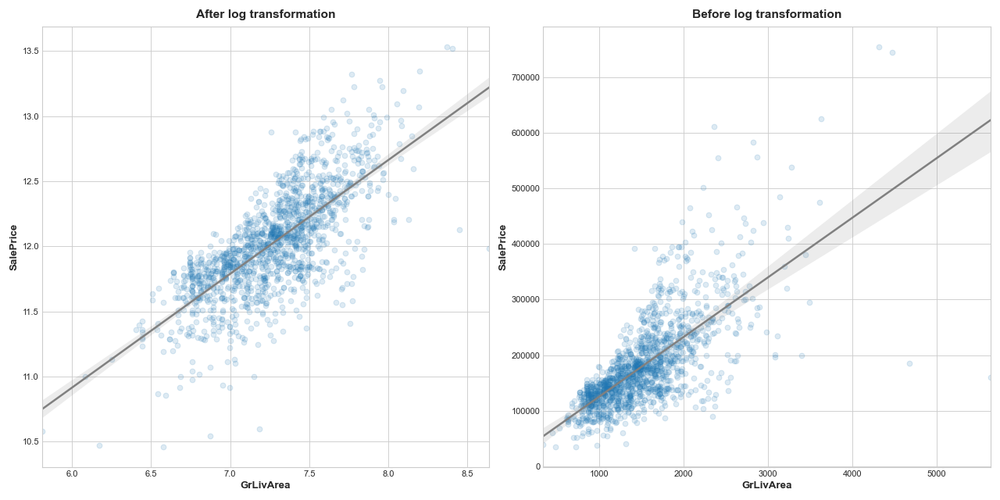

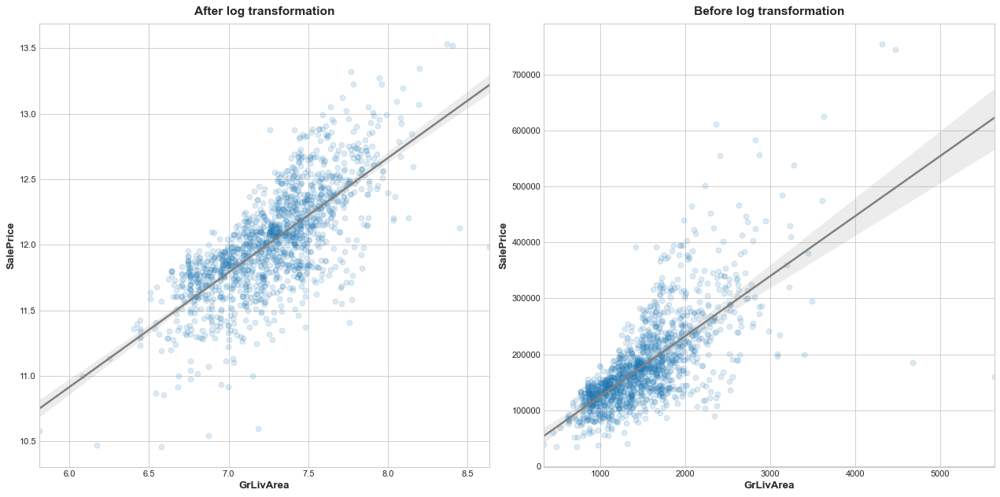

In [31]:
fig, ax = plt.subplots(1,2, figsize=(16,8),dpi=80)
ax[0].set_title('After log transformation')
sns.regplot(y=data['SalePrice'],x=np.log(data['GrLivArea']), ax=ax[0], line_kws= {'color':'grey'}, scatter_kws={'alpha': 0.15})
ax[1].set_title('Before log transformation')
sns.regplot(y=b4_log,x=data['GrLivArea'] ,ax=ax[1],line_kws= {'color':'grey'}, scatter_kws={'alpha': 0.15})
plt.show()

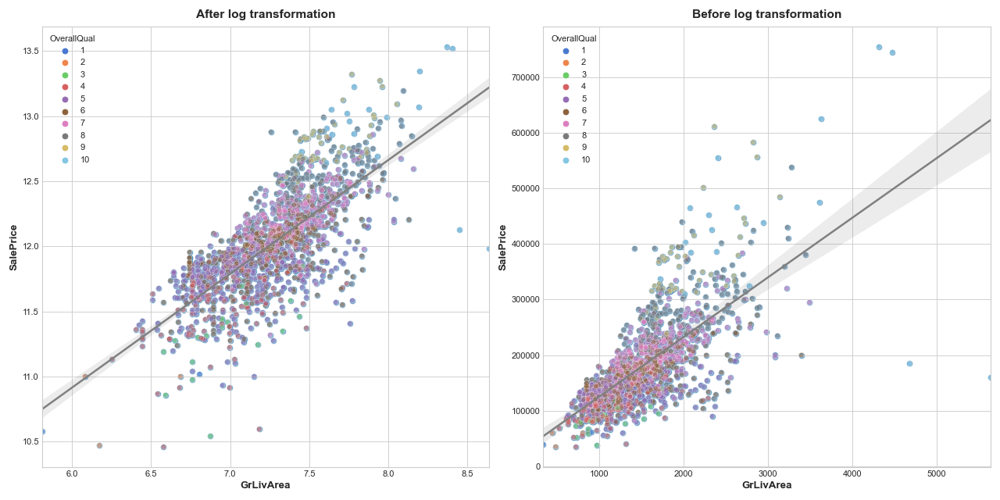

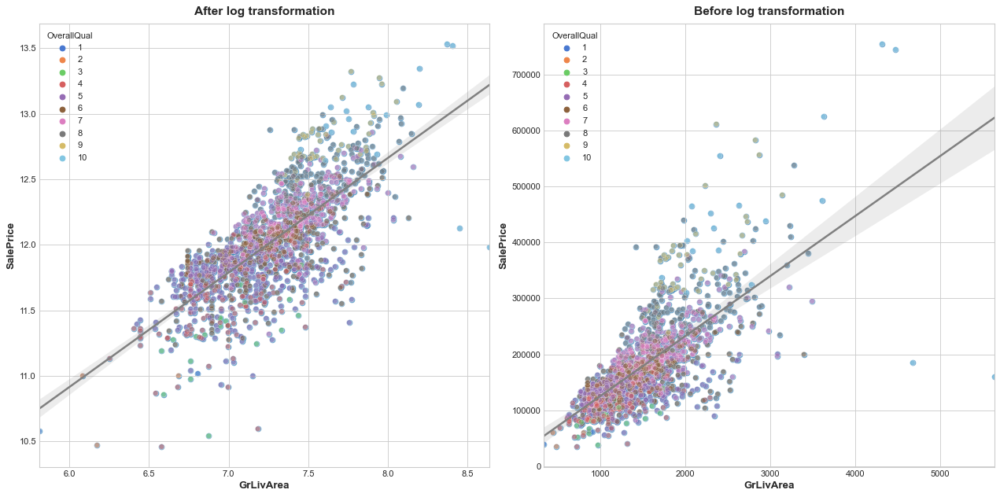

In [32]:
fig, ax = plt.subplots(1,2, figsize=(16,8),dpi=80)
ax[0].set_title('After log transformation')
sns.regplot(y=data['SalePrice'],x=np.log(data['GrLivArea']),data=data, ax=ax[0], line_kws= {'color':'grey'}, scatter_kws={'alpha': 0.5, 'zorder':-1})
sns.scatterplot(x=np.log(data['GrLivArea']), y=data['SalePrice'], hue=data['OverallQual'], alpha=0.5, ax=ax[0],palette="muted")
ax[1].set_title('Before log transformation')
sns.regplot(y=b4_log, x='GrLivArea' ,data=data,ax=ax[1],line_kws= {'color':'grey'}, scatter_kws={'alpha': 0.5, 'zorder':-1})
sns.scatterplot(x=data['GrLivArea'], y=b4_log, hue=data['OverallQual'], alpha=0.5, ax=ax[1],palette="muted")
plt.show()

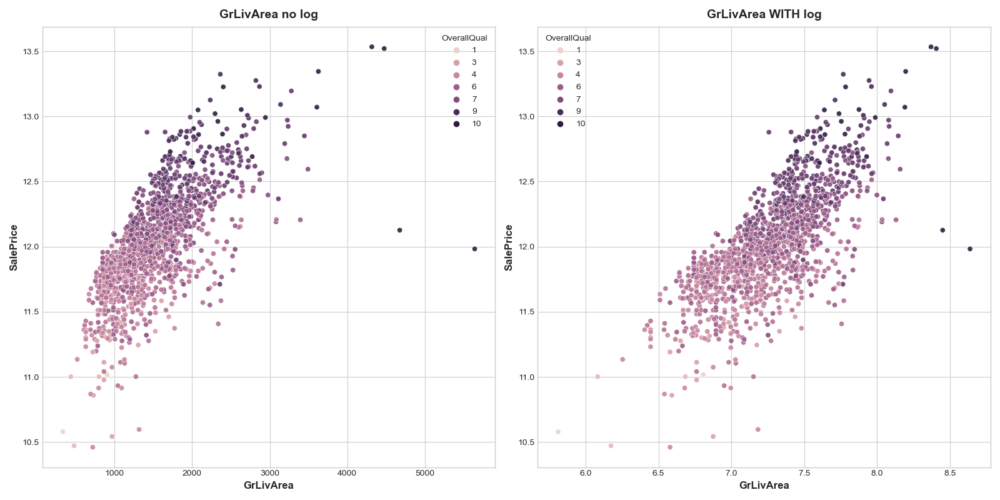

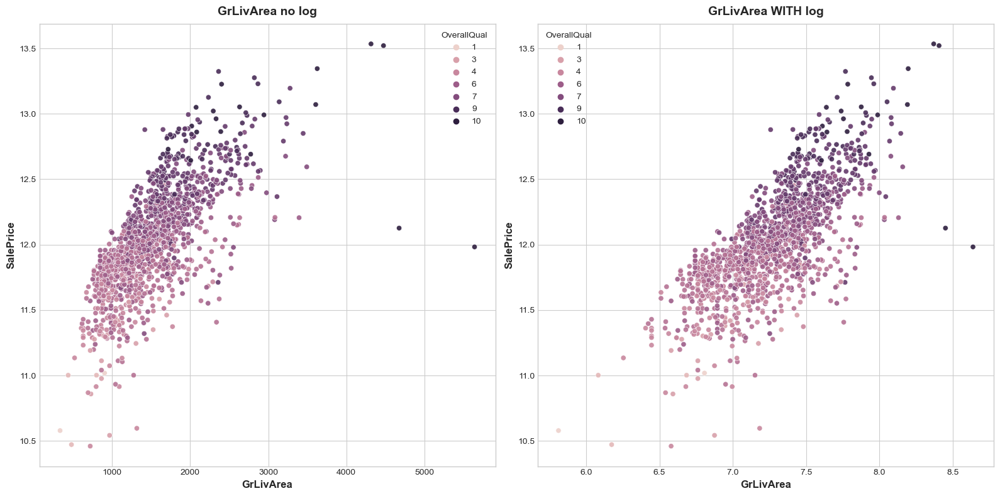

In [33]:
fig , ax = plt.subplots(1,2, figsize=(16,8))
#plt.figure(figsize=(8,8))
ax[0].set_title('GrLivArea no log')
sns.scatterplot(x=(data['GrLivArea']), y=data['SalePrice'], hue=data['OverallQual'], alpha=0.9, ax=ax[0])
plt.plot(data=data[['SalePrice', 'GrLivArea']],ax=ax[0])
ax[1].set_title('GrLivArea WITH log')
sns.scatterplot(x=np.log(data['GrLivArea']), y=data['SalePrice'], hue=data['OverallQual'], alpha=0.9, ax=ax[1])
plt.show()

In [34]:
# Easier to build the chart with plotly
import plotly.express as px

fig = px.scatter(data, x="GrLivArea", y="SalePrice", color="OverallQual", trendline="ols",  color_continuous_scale=px.colors.qualitative.Pastel)
fig.show()

In [35]:
# allowes me to just see the segment i want 
data3 = data.copy()
data3['OverallQual']= data['OverallQual'].astype(str)
fig = px.scatter(data3, x="GrLivArea", y="SalePrice", color="OverallQual", trendline="ols")
fig.show()

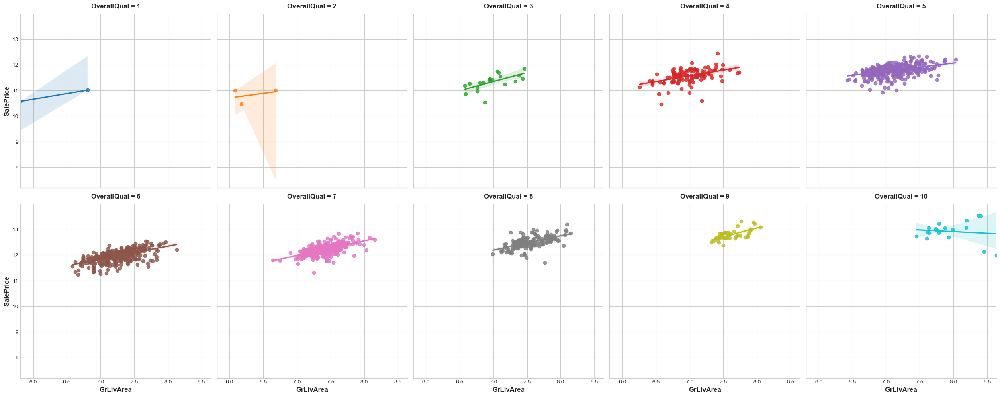

In [36]:
sns.lmplot(data=data2, x='GrLivArea', y='SalePrice',hue='OverallQual', col='OverallQual', col_wrap = 5)

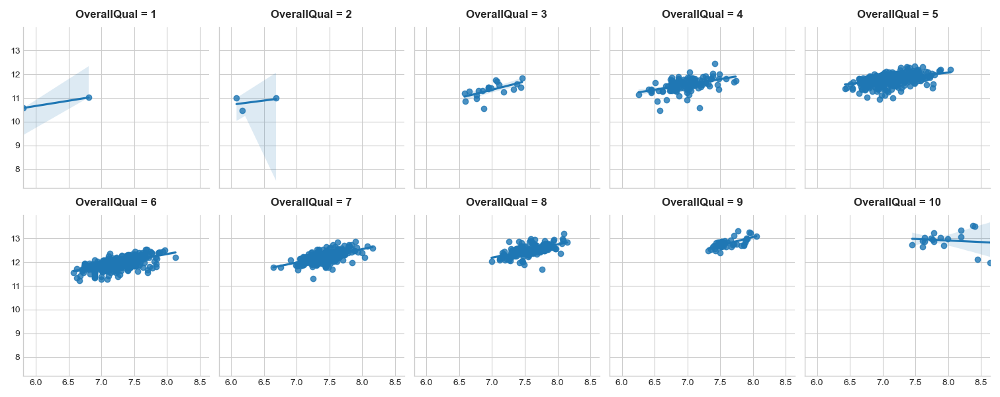

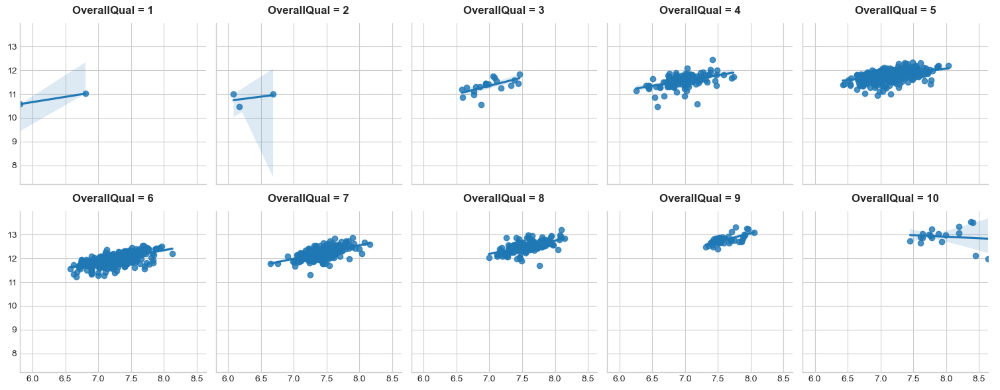

In [37]:
g = sns.FacetGrid(data2[['LotFrontage','GrLivArea','OverallQual','SalePrice']], col="OverallQual", col_wrap=5)
#g.map(sns.scatterplot, "total_bill", "tip", alpha=.7)
g.map_dataframe(sns.regplot, x='GrLivArea', y = 'SalePrice', data=data2[['LotFrontage','GrLivArea','OverallQual','SalePrice']])
g.add_legend()
plt.show()

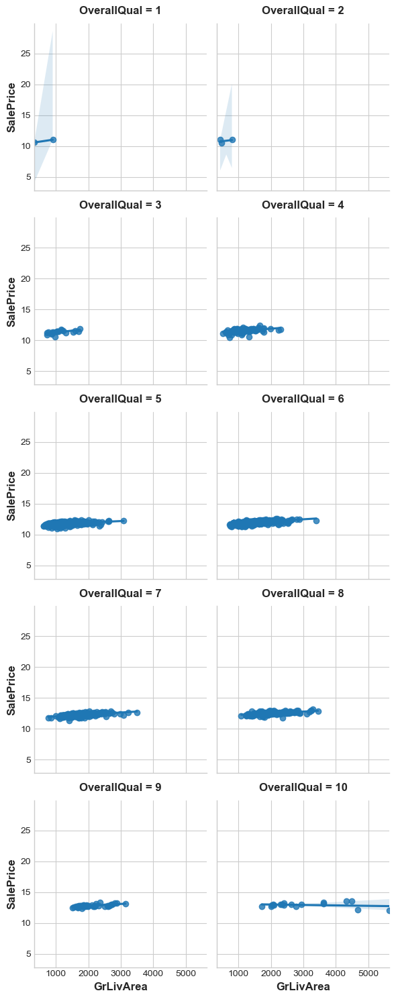

In [38]:
g = sns.lmplot(x='GrLivArea', y='SalePrice', data=data[['LotFrontage','GrLivArea','OverallQual','SalePrice']],
               col='OverallQual', height=3, aspect=1, col_wrap=2)

<a id='1f'></a>

### 1F) Drop outliers from Target 


[Back to Table of Contents](#table)

**The 5 low sale price  outliers , from the charts , shows that they are way lower than market value**  
**Therefore conclude will remove the following rows from the data set**

High GrLivArea Low Saleprice outlier rows : 524, 1299
low price outlier rows: 31,496,534,917,969

In [39]:
outliers = data.loc[[31,496,534,917,969,1299,524], :]
outliers

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Feedr,Norm,1Fam,2Story,4,4,1920,1950,Gambrel,CompShg,BrkFace,BrkFace,None,0.0,TA,Fa,BrkTil,TA,TA,No,Unf,0,Unf,0,649,649,GasA,TA,N,SBrkr,649,668,0,1317,0,0,1,0,3,1,TA,6,Typ,0,NaN,Detchd,1920.0,Unf,1,250,TA,Fa,N,0,54,172,0,0,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,10.596635
496,30,C (all),60.0,7879,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1Story,4,5,1920,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,495,Unf,0,225,720,GasA,TA,N,FuseA,720,0,0,720,0,0,1,0,2,1,TA,4,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,523,115,0,0,0,NaN,GdWo,NaN,0,11,2009,WD,Abnorml,10.460242
534,20,RL,50.0,5000,Pave,NaN,Reg,Low,AllPub,Inside,Mod,BrkSide,Norm,Norm,1Fam,1Story,1,3,1946,1950,Gable,CompShg,VinylSd,VinylSd,None,0.0,Fa,Fa,Slab,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,Fa,N,FuseF,334,0,0,334,0,0,1,0,1,1,Fa,2,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,0,0,0,0,NaN,NaN,NaN,0,1,2007,WD,Normal,10.578980
917,20,C (all),50.0,9000,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1Story,2,3,1949,1950,Gable,CompShg,AsbShng,AsbShng,None,0.0,TA,TA,CBlock,TA,TA,Av,BLQ,50,Unf,0,430,480,GasA,TA,N,FuseA,480,0,0,480,1,0,0,0,1,1,TA,4,Typ,0,NaN,Detchd,1958.0,Unf,1,308,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,10,2006,WD,Abnorml,10.471950
969,50,RM,50.0,5925,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,1.5Fin,3,6,1910,1950,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,600,600,Grav,Fa,N,SBrkr,600,368,0,968,0,0,1,0,2,1,TA,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,GdWo,NaN,0,5,2009,WD,Abnorml,10.542706
1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,5644,Unf,0,466,6110,GasA,Ex,Y,SBrkr,4692,950,0,5642,2,0,2,1,3,1,Ex,12,Typ,3,Gd,Attchd,2008.0,Fin,2,1418,TA,TA,Y,214,292,0,0,0,480,Gd,NaN,NaN,0,1,2008,New,Partial,11.982929
524,60,RL,130.0,40094,Pave,NaN,IR1,Bnk,AllPub,Inside,Gtl,Edwards,PosN,PosN,1Fam,2Story,10,5,2007,2008,Hip,CompShg,CemntBd,CmentBd,Stone,762.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,2260,Unf,0,878,3138,GasA,Ex,Y,SBrkr,3138,1538,0,4676,1,0,3,1,3,1,Ex,11,Typ,1,Gd,BuiltIn,2007.0,Fin,3,884,TA,TA,Y,208,406,0,0,0,0,NaN,NaN,NaN,0,10,2007,New,Partial,12.126759


In [40]:
print(f'Total rows before: {len(data)}')

new_data = data.drop(index= [31,496,534,917,969,1299,524])
print(f'Total rows after: {len(new_data)}')


Total rows before: 1460
Total rows after: 1453


#### Test if  a base model will work better with the dropped outliers

In [41]:
# drop saleprice
data_num = data_num.drop('SalePrice',axis=1)


data_num.notnull().all().values
data_num.loc[:,data_num.notnull().all().values]

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,8450,7,5,2003,2003,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2,548,0,61,0,0,0,0,0,2,2008
2,20,9600,6,8,1976,1976,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,2,460,298,0,0,0,0,0,0,5,2007
3,60,11250,7,5,2001,2002,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2,608,0,42,0,0,0,0,0,9,2008
4,70,9550,7,5,1915,1970,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,3,642,0,35,272,0,0,0,0,2,2006
5,60,14260,8,5,2000,2000,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,3,836,192,84,0,0,0,0,0,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,60,7917,6,5,1999,2000,0,0,953,953,953,694,0,1647,0,0,2,1,3,1,7,1,2,460,0,40,0,0,0,0,0,8,2007
1457,20,13175,6,6,1978,1988,790,163,589,1542,2073,0,0,2073,1,0,2,0,3,1,7,2,2,500,349,0,0,0,0,0,0,2,2010
1458,70,9042,7,9,1941,2006,275,0,877,1152,1188,1152,0,2340,0,0,2,0,4,1,9,2,1,252,0,60,0,0,0,0,2500,5,2010


In [42]:
X_train ,X_test,y_train, y_test = train_test_split(data_num.loc[:,data_num.notnull().all().values], data['SalePrice'], test_size=0.2, random_state=10)
rf = RF(n_estimators=100, n_jobs=1, oob_score=True)
rf.fit(X_train, y_train)
pred = rf.predict(X_test)
mean_squared_error(pred, y_test, squared=False)

0.15034720381404043

In [43]:
for i in range(5):    
    score = cross_val_score(rf, data_num.loc[:,data_num.notnull().all().values], data['SalePrice'], cv=5, scoring = 'neg_root_mean_squared_error')
    print(f'test{i}: {score}')
    print(f'Average score for test{i} is {score.mean()}')

test0: [-0.14436413 -0.15802616 -0.14834953 -0.12828863 -0.15290877]
Average score for test0 is -0.1463874456733382
test1: [-0.14220113 -0.15873714 -0.14763558 -0.13213613 -0.15442343]
Average score for test1 is -0.1470266823542648
test2: [-0.14192234 -0.16071583 -0.14621293 -0.12751333 -0.15254494]
Average score for test2 is -0.14578187252572888
test3: [-0.14198344 -0.15932392 -0.14681199 -0.12851943 -0.15166201]
Average score for test3 is -0.14566015883744024
test4: [-0.14385305 -0.15914083 -0.14650545 -0.13081575 -0.15307312]
Average score for test4 is -0.14667763996975824


In [44]:
data_num_new = new_data.select_dtypes(exclude='O')
data_num_new = data_num_new.drop('SalePrice',axis=1)
data_num_new.notnull().all().values

data_num_new.loc[:,data_num_new.notnull().all().values]

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,8450,7,5,2003,2003,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2,548,0,61,0,0,0,0,0,2,2008
2,20,9600,6,8,1976,1976,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,2,460,298,0,0,0,0,0,0,5,2007
3,60,11250,7,5,2001,2002,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2,608,0,42,0,0,0,0,0,9,2008
4,70,9550,7,5,1915,1970,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,3,642,0,35,272,0,0,0,0,2,2006
5,60,14260,8,5,2000,2000,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,3,836,192,84,0,0,0,0,0,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,60,7917,6,5,1999,2000,0,0,953,953,953,694,0,1647,0,0,2,1,3,1,7,1,2,460,0,40,0,0,0,0,0,8,2007
1457,20,13175,6,6,1978,1988,790,163,589,1542,2073,0,0,2073,1,0,2,0,3,1,7,2,2,500,349,0,0,0,0,0,0,2,2010
1458,70,9042,7,9,1941,2006,275,0,877,1152,1188,1152,0,2340,0,0,2,0,4,1,9,2,1,252,0,60,0,0,0,0,2500,5,2010


In [45]:
X_train2 ,X_test2,y_train2, y_test2 = train_test_split(data_num_new.loc[:,data_num_new.notnull().all().values], data['SalePrice'].drop(index=[31,496,534,917,969,1299,524]), test_size=0.2, random_state=10)
rf = RF(n_estimators=100, n_jobs=1, oob_score=True)
rf.fit(X_train2, y_train2)
pred2 = rf.predict(X_test2)
mean_squared_error(pred2, y_test2, squared=False)

0.13876857569914286

In [46]:
for i in range(5):
    score = cross_val_score(rf,data_num_new.loc[:,data_num_new.notnull().all().values] , data['SalePrice'].drop(index=[31,496,534,917,969,1299,524]), cv=5, scoring = 'neg_root_mean_squared_error')
    print(f'test{i}: {score}')
    print(f'Average score for test{i} is {score.mean()}')

test0: [-0.13133941 -0.13162599 -0.14766157 -0.11575844 -0.14286741]
Average score for test0 is -0.13385056309353177
test1: [-0.13229155 -0.13112486 -0.14737863 -0.11670013 -0.14395622]
Average score for test1 is -0.1342902767384287
test2: [-0.13295405 -0.1319069  -0.14709058 -0.11629705 -0.14326907]
Average score for test2 is -0.1343035298978203
test3: [-0.13333206 -0.13084386 -0.14820224 -0.11880829 -0.1438712 ]
Average score for test3 is -0.1350115318685654
test4: [-0.13397655 -0.13104519 -0.14760651 -0.11915441 -0.14431994]
Average score for test4 is -0.13522051895589948


#### Overall it seems deleting the outliers improve the model score  

<a id='1g'></a>

### 1G) Univariate Analysis on the Features

[Back to Table of Contents](#table)


In [47]:
data_num

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008
2,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007
3,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008
4,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006
5,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,60,62.0,7917,6,5,1999,2000,0.0,0,0,953,953,953,694,0,1647,0,0,2,1,3,1,7,1,1999.0,2,460,0,40,0,0,0,0,0,8,2007
1457,20,85.0,13175,6,6,1978,1988,119.0,790,163,589,1542,2073,0,0,2073,1,0,2,0,3,1,7,2,1978.0,2,500,349,0,0,0,0,0,0,2,2010
1458,70,66.0,9042,7,9,1941,2006,0.0,275,0,877,1152,1188,1152,0,2340,0,0,2,0,4,1,9,2,1941.0,1,252,0,60,0,0,0,0,2500,5,2010


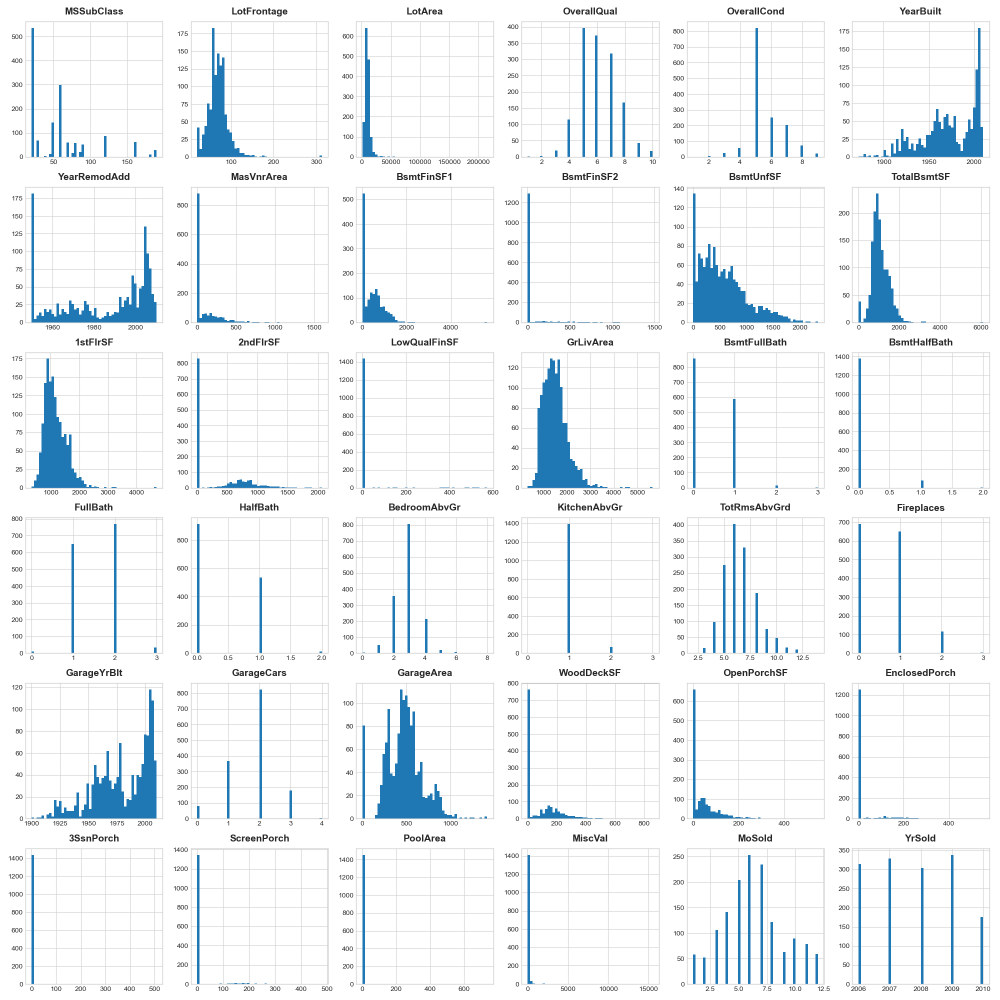

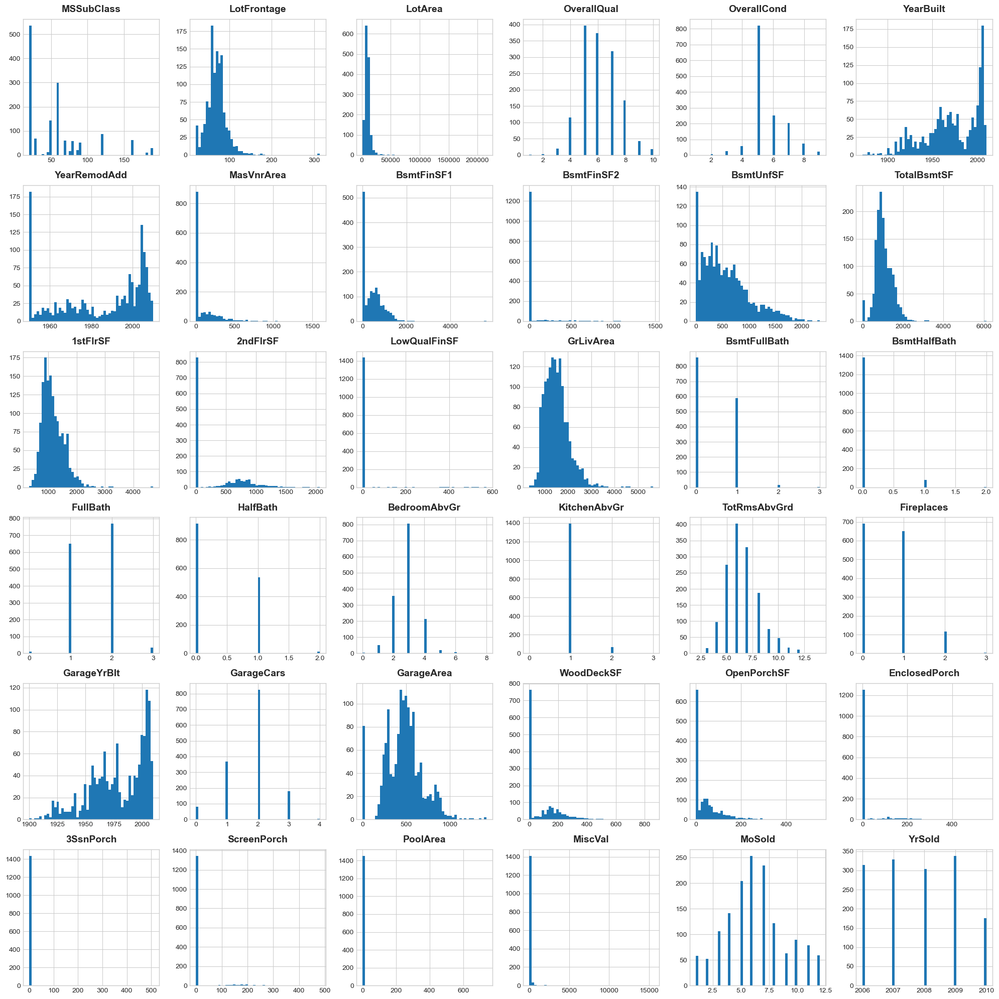

In [49]:
data_num.hist(figsize=(20,20), bins =50, xlabelsize=10, ylabelsize=10)
plt.show()

In [60]:
data['BsmtFinSF2'].groupby(['BsmtFinSF2'])

array([   0,   32,  668,  486,   93,  491,  506,  712,  362,   41,  169,
        869,  150,  670,   28, 1080,  181,  768,  215,  374,  208,  441,
        184,  279,  306,  180,  580,  690,  692,  228,  125, 1063,  620,
        175,  820, 1474,  264,  479,  147,  232,  380,  544,  294,  258,
        121,  391,  531,  344,  539,  713,  210,  311, 1120,  165,  532,
         96,  495,  174, 1127,  139,  202,  645,  123,  551,  219,  606,
        612,  480,  182,  132,  336,  468,  287,   35,  499,  723,  119,
         40,  117,  239,   80,  472,   64, 1057,  127,  630,  128,  377,
        764,  345, 1085,  435,  823,  500,  290,  324,  634,  411,  841,
       1061,  466,  396,  354,  149,  193,  273,  465,  400,  682,  557,
        230,  106,  791,  240,  547,  469,  177,  108,  600,  492,  211,
        168, 1031,  438,  375,  144,   81,  906,  608,  276,  661,   68,
        173,  972,  105,  420,  546,  334,  352,  872,  110,  627,  163,
       1029], dtype=int64)

<AxesSubplot:ylabel='Count'>

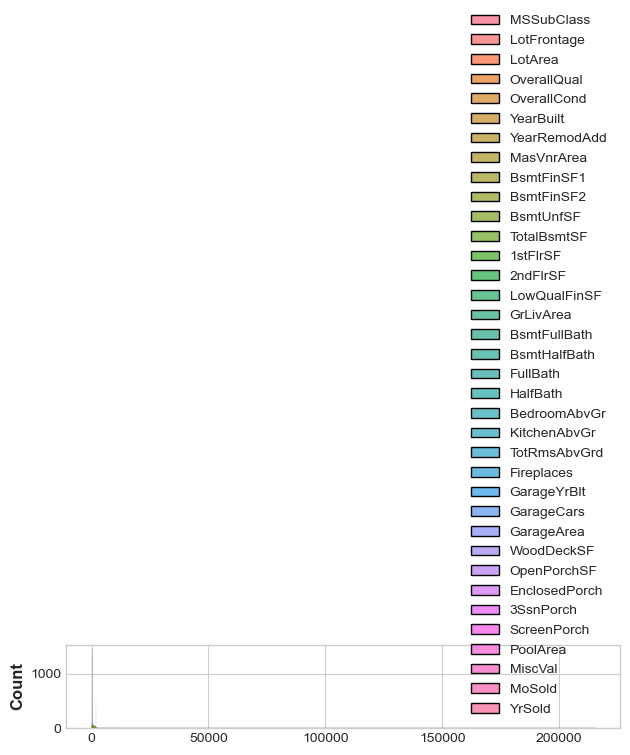

In [232]:
sns.catplot(data_num, kind='hist')
plt.show()

sns.displot(data_num, kind='hist')
plt.show()

#sns.histplot(data_num)

<a id='1h'></a>

### 1f) Multivariate Analysis on the Features

[Back to Table of Contents](#table)

Shape feature for Multivariate Analysis (Prevent skewed representation of data)